In [ ]:
import os
import glob
import xml.etree.ElementTree as ET
import pandas as pd
# import tensorflow as tf
# print(tf.__version__)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

Mounted at /content/gdrive
 0001-F-037Y0.jpg   customTF2	       'My Drive'	  SSD-Tensorflow-On-Custom-Dataset
 0003-F-013Y0.jpg  'IMDB Dataset.csv'   obesity_dataset   yolo_training
'Colab Notebooks'   models-master       ramnaidu.jpg


In [ ]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"


In [ ]:

# clone the tensorflow models on the colab cloud vm
!git clone --q https://github.com/tensorflow/models.git

#navigate to /models/research folder to compile protos
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install --user .

!pip install tensorflow==2.15.0

/content/models/research
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 45.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 83.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 65.7 MB/s eta 0:00:00
     ━━━━━━

In [ ]:
pwd

'/content/models/research'

In [ ]:
# testing the model builder
!python object_detection/builders/model_builder_tf2_test.py

2024-05-18 06:49:04.311966: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 06:49:04.312054: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 06:49:04.313932: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-18 06:49:04.324263: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-18 06:49:05.994919: W tensorflow/compiler/tf2

In [ ]:
%cd /mydrive/customTF2/data/

# unzip the datasets and their contents so that they are now in /mydrive/customTF2/data/ folder
!unzip /mydrive/customTF2/AP.zip -d .
!unzip /mydrive/customTF2/AP_labels4.zip -d .

/content/gdrive/My Drive/customTF2/data
Archive:  /mydrive/customTF2/AP.zip
  inflating: ./AP/0001-F-037Y0.jpg   
  inflating: ./AP/0003-F-013Y0.jpg   
  inflating: ./AP/0004-F-010Y0.jpg   
  inflating: ./AP/0005-F-025Y0.jpg   
  inflating: ./AP/0006-F-031Y0.jpg   
  inflating: ./AP/0007-F-006Y0.jpg   
  inflating: ./AP/0008-M-022Y0.jpg   
  inflating: ./AP/0009-F-038Y0.jpg   
  inflating: ./AP/0010-F-037Y0.jpg   
  inflating: ./AP/0011-F-063Y0.jpg   
  inflating: ./AP/0012-F-013Y0.jpg   
  inflating: ./AP/0013-M-022Y0.jpg   
  inflating: ./AP/0014-F-062Y0.jpg   
  inflating: ./AP/0015-M-020Y0.jpg   
  inflating: ./AP/0016-F-023Y0.jpg   
  inflating: ./AP/0017-F-040Y0.jpg   
  inflating: ./AP/0018-F-020Y0.jpg   
  inflating: ./AP/0019-F-015Y0.jpg   
  inflating: ./AP/0020-M-030Y0.jpg   
  inflating: ./AP/0021-F-079Y0.jpg   
  inflating: ./AP/0022-M-006Y0.jpg   
  inflating: ./AP/0023-F-014Y0.jpg   
  inflating: ./AP/0024-F-014Y0.jpg   
  inflating: ./AP/0025-F-015Y0.jpg   
  inflating:

In [ ]:
%cd /mydrive/customTF2/data/

/content/gdrive/My Drive/customTF2/data


In [ ]:
! ls

AP
AP_labels4
label_map.pbtxt
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
test_labels
test_labels.csv
train_labels
train_labels.csv


In [ ]:
#creating two dir for training and testing
!mkdir test_labels train_labels

# lists the files inside 'annotations' in a random order (not really random, by their hash value instead)
# Moves the first 274/1370 labels (20% of the labels) to the testing dir: `test_labels`
!ls AP_labels4/* | sort -R | head -80 | xargs -I{} mv {} test_labels/


# Moves the rest of the labels ( 1096 labels ) to the training dir: `train_labels`
!ls AP_labels4/* | xargs -I{} mv {} train_labels/

In [ ]:
%cd  /mydrive/customTF2/data/

/content/gdrive/My Drive/customTF2/data


In [ ]:
# import os
# import glob
# import pandas as pd
# import xml.etree.ElementTree as ET

# def xml_to_csv(path):
#     classes_names = []
#     xml_list = []

#     for xml_file in glob.glob(path + '/*.xml'):
#         tree = ET.parse(xml_file)
#         root = tree.getroot()

#         for member in root.findall('object'):
#             classes_names.append(member.find('name').text)
#             value = (root.find('filename').text,
#                      int(root.find('size').find('width').text),
#                      int(root.find('size').find('height').text),
#                      member.find('name').text,
#                      int(member.find('bndbox').find('xmin').text),
#                      int(member.find('bndbox').find('ymin').text),
#                      int(member.find('bndbox').find('xmax').text),
#                      int(member.find('bndbox').find('ymax').text))
#             xml_list.append(value)

#     column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
#     xml_df = pd.DataFrame(xml_list, columns=column_name)
#     classes_names = list(set(classes_names))
#     classes_names.sort()
#     return xml_df, classes_names

# for label_path in ['train_labels', 'test_labels']:
#     image_path = os.path.join(os.getcwd(), label_path)
#     xml_df, classes = xml_to_csv(label_path)
#     xml_df.to_csv(f'{label_path}.csv', index=None)
#     print(f'Successfully converted {label_path} XML to CSV.')

# label_map_path = "label_map.pbtxt"
# pbtxt_content = ""

# for i, class_name in enumerate(classes):
#     pbtxt_content += "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)

# pbtxt_content = pbtxt_content.strip()
# with open(label_map_path, "w") as f:
#     f.write(pbtxt_content)
#     print('Successfully created label_map.pbtxt.')


Successfully converted train_labels XML to CSV.
Successfully converted test_labels XML to CSV.
Successfully created label_map.pbtxt.


In [ ]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET

def xml_to_csv(path):
    classes_names = []
    xml_list = []

    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()

        for member in root.findall('object'):
          tmpi = int(member.find('bndbox').find('xmin').text)
          tmps = member.find('bndbox').find('xmin').text
          if tmpi > int(member.find('bndbox').find('xmax').text):
            member.find('bndbox').find('xmin').text = member.find('bndbox').find('xmax').text
            member.find('bndbox').find('xmax').text = tmps
          tmpi = int(member.find('bndbox').find('ymin').text)
          tmps = member.find('bndbox').find('ymin').text
          if tmpi > int(member.find('bndbox').find('ymax').text):
            member.find('bndbox').find('ymin').text = member.find('bndbox').find('ymax').text
            member.find('bndbox').find('ymax').text = tmps
          classes_names.append(member.find('name').text)
          value = (root.find('filename').text,
                  int(root.find('size').find('width').text),
                  int(root.find('size').find('height').text),
                  member.find('name').text,
                  int(member.find('bndbox').find('xmin').text),
                  int(member.find('bndbox').find('ymin').text),
                  int(member.find('bndbox').find('xmax').text),
                  int(member.find('bndbox').find('ymax').text))
          xml_list.append(value)

    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    classes_names = list(set(classes_names))
    classes_names.sort()
    return xml_df, classes_names

for label_path in ['train_labels', 'test_labels']:
    image_path = os.path.join(os.getcwd(), label_path)
    xml_df, classes = xml_to_csv(label_path)
    xml_df.to_csv(f'{label_path}.csv', index=None)
    print(f'Successfully converted {label_path} XML to CSV.')

label_map_path = "label_map.pbtxt"
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content += "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)

pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt.')


Successfully converted train_labels XML to CSV.
Successfully converted test_labels XML to CSV.
Successfully created label_map.pbtxt.


In [ ]:
#Usage:
#!python generate_tfrecord.py output.csv output_pb.txt /path/to/images output.tfrecords

#For train.record
!python /mydrive/customTF2/generate_tfrecord.py train_labels.csv  label_map.pbtxt AP/ train.record

#For test.record
!python /mydrive/customTF2/generate_tfrecord.py test_labels.csv  label_map.pbtxt AP/ test.record


2024-05-13 06:38:39.152587: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 06:38:39.152669: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 06:38:39.155119: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-13 06:38:39.170635: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-13 06:38:40.774985: W tensorflow/compiler/tf2

In [ ]:
%cd /content/gdrive/MyDrive/customTF2/data/

/content/gdrive/MyDrive/customTF2/data


In [ ]:
#Download the pre-trained model ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz into the data folder & unzip it.
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
! wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz


!tar -xzvf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
#!tar -xzvf efficientdet_d0_coco17_tpu-32.tar.gz
#!tar -xzvf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
!tar -xzvf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2024-05-18 07:00:02--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.217.207, 108.177.12.207, 108.177.11.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.217.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  28.9MB/s    in 7.3s    

2024-05-18 07:00:10 (27.5 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_320

In [ ]:
#copy the edited config file from the configs/tf2 directory to the data/ folder in your drive

!cp /content/models/research/object_detection/configs/tf2/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config /mydrive/customTF2/data
#!cp /content/models/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config /mydrive/customTF2/data

In [ ]:
#load tensorboard

%load_ext tensorboard
%tensorboard --logdir '/content/gdrive/MyDrive/customTF2/resnet_training_640'

<IPython.core.display.Javascript object>

In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
# Run the command below from the content/models/research/object_detection directory
"""
PIPELINE_CONFIG_PATH=path/to/pipeline.config
MODEL_DIR=path to training checkpoints directory
NUM_TRAIN_STEPS=50000
SAMPLE_1_OF_N_EVAL_EXAMPLES=1

python model_main_tf2.py -- \
  --model_dir=$MODEL_DIR --num_train_steps=$NUM_TRAIN_STEPS \
  --sample_1_of_n_eval_examples=$SAMPLE_1_OF_N_EVAL_EXAMPLES \
  --pipeline_config_path=$PIPELINE_CONFIG_PATH \
  --alsologtostderr
"""

!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF2/data/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config ----num_train_steps=10000 --model_dir=/mydrive/customTF2/resnet_training_640 --alsologtostderr

2024-05-18 07:07:37.535657: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 07:07:37.535742: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 07:07:37.539104: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-18 07:07:37.557815: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-18 07:07:39.881599: W tensorflow/compiler/tf2

In [ ]:
# Step 1: Read the contents of the file
file_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'

with open(file_path, 'r') as file:
    file_contents = file.readlines()

# Step 2: Make changes to the code
# Find the line number where you want to insert the import statement
# For example, let's say you want to insert it after line 10
import_statement = 'import tensorflow as tf\n'

# Insert the import statement at the desired line number
line_number_to_insert = 35
file_contents.insert(line_number_to_insert, import_statement)

# Convert the list of lines back to a single string
modified_contents = ''.join(file_contents)

# Step 3: Write the modified code back to the same file
# This will overwrite the original file with the modified contents
with open(file_path, 'w') as modified_file:
    modified_file.write(modified_contents)

# Print a message indicating that the file has been written
print(f'Modified code has been written back to {file_path}')




Modified code has been written back to /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py


In [ ]:
# Step 1: Read the contents of the file
file_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'

with open(file_path, 'r') as file:
    file_contents = file.read()

# Step 2: Make changes to the code
# Replace occurrences of 'control_flow_ops' with 'tf'
modified_contents = file_contents.replace('control_flow_ops', 'tf')

# Step 3: Write the modified code back to the same file
# This will overwrite the original file with the modified contents
with open(file_path, 'w') as modified_file:
    modified_file.write(modified_contents)

# Print a message indicating that the file has been written
print(f'Modified code has been written back to {file_path}')


Modified code has been written back to /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py


In [ ]:
# Step 1: Read the contents of the file
file_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'

with open(file_path, 'r') as file:
    file_contents = file.readlines()

# Step 2: Make changes to the code
# Define the original and replacement strings
original_string = 'from tensorflow.python.ops import tf'
replacement_string = 'from tensorflow.python.ops import control_flow_ops'

# Replace the original string with the replacement string in the file contents
modified_contents = ''.join([line.replace(original_string, replacement_string) for line in file_contents])

# Step 3: Write the modified code back to the same file
# This will overwrite the original file with the modified contents
with open(file_path, 'w') as modified_file:
    modified_file.write(modified_contents)

# Print a message indicating that the file has been written
print(f'Modified code with the line changed has been written back to {file_path}')


Modified code with the line changed has been written back to /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py


In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
# Run the command below from the content/models/research/object_detection directory
"""
PIPELINE_CONFIG_PATH=path/to/pipeline.config
MODEL_DIR=path to training checkpoints directory
CHECKPOINT_DIR=${MODEL_DIR}
NUM_TRAIN_STEPS=50000
SAMPLE_1_OF_N_EVAL_EXAMPLES=1

python model_main_tf2.py -- \
  --model_dir=$MODEL_DIR --num_train_steps=$NUM_TRAIN_STEPS \
  --checkpoint_dir=${CHECKPOINT_DIR} \
  --sample_1_of_n_eval_examples=$SAMPLE_1_OF_N_EVAL_EXAMPLES \
  --pipeline_config_path=$PIPELINE_CONFIG_PATH \
  --alsologtostderr
"""

!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF2/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --model_dir=/mydrive/customTF2/training_640/ --checkpoint_dir=/mydrive/customTF2/training_640/ --alsologtostderr

2024-05-17 12:46:56.233105: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-17 12:46:56.233151: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-17 12:46:56.234618: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-17 12:46:56.242034: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-17 12:46:57.250662: W tensorflow/comp

In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
##Export inference graph
!python exporter_main_v2.py --trained_checkpoint_dir=/mydrive/customTF2/training_320 --pipeline_config_path=/content/gdrive/MyDrive/customTF2/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --output_directory /mydrive/customTF2/data/inference_graph_320

2024-05-16 09:50:38.544553: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-16 09:50:38.544640: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-16 09:50:38.547421: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-16 09:50:38.561156: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-16 09:50:40.041724: W tensorflow/compiler/tf2

In [ ]:
# Different font-type for labels text.(This step is optional)
# !wget https://freefontsdownload.net/download/160187/arial.zip
# !unzip arial.zip -d .
!wget https://freefontsdownload.net/free-arial-font-160187.htm
%cd utils/
!sed -i "s/font = ImageFont.truetype('arial.ttf', 24)/font = ImageFont.truetype('arial.ttf', 50)/" visualization_utils.py
%cd ..

--2024-05-15 06:13:53--  https://freefontsdownload.net/free-arial-font-160187.htm
Resolving freefontsdownload.net (freefontsdownload.net)... 188.114.97.0, 188.114.96.0, 2a06:98c1:3121::, ...
Connecting to freefontsdownload.net (freefontsdownload.net)|188.114.97.0|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘free-arial-font-160187.htm’

free-arial-font-160     [ <=>                ]  46.04K  --.-KB/s    in 0s      

2024-05-15 06:13:56 (113 MB/s) - ‘free-arial-font-160187.htm’ saved [47150]

/content/models/research/object_detection/utils
/content/models/research/object_detection


In [ ]:
! pip install tensorflow-object-detection-api



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.4/577.4 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 777.1/777.1 kB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.3 MB/s eta 0:00:00
  Created wheel for tensorflow-object-detection-api: filename=tensorflow_object_detection_api-0.1.1-py3-none-any.whl size=844487 sha256=7de0c9b3396332e753ae66d04e3eecaa13892d2706251ab369b45e1fef4dde66
  Stored in directory: /root/.cache/pip/wheels/8a/55/68/c084bc2cd93c41fd8f7e2ef9e6bbcb2c35a3e4b49e42044d02
Successfully built tensorflow-object-detection-api


In [ ]:
%cd /usr/local/lib/python3.10/dist-packages/object_detection/utils

/usr/local/lib/python3.10/dist-packages/object_detection/utils


In [ ]:
%pycat label_map_util.py

In [ ]:
# Step 1: Read the contents of the file
file_path = '/usr/local/lib/python3.10/dist-packages/object_detection/utils/label_map_util.py'

with open(file_path, 'r') as file:
    file_contents = file.readlines()

# Step 2: Make changes to the code
# Define the original and replacement strings
original_string = 'with tf.gfile.GFile(path, 'r') as fid:'
replacement_string = 'with tf.io.gfile.GFile(path, 'r') as fid:'

# Replace the original string with the replacement string in the file contents
modified_contents = ''.join([line.replace(original_string, replacement_string) for line in file_contents])

# Step 3: Write the modified code back to the same file
# This will overwrite the original file with the modified contents
with open(file_path, 'w') as modified_file:
    modified_file.write(modified_contents)

# Print a message indicating that the file has been written
print(f'Modified code with the line changed has been written back to {file_path}')


Modified code with the line changed has been written back to /usr/local/lib/python3.10/dist-packages/object_detection/utils/label_map_util.py


In [ ]:
%pycat label_map_util.py

Loading model...Done!


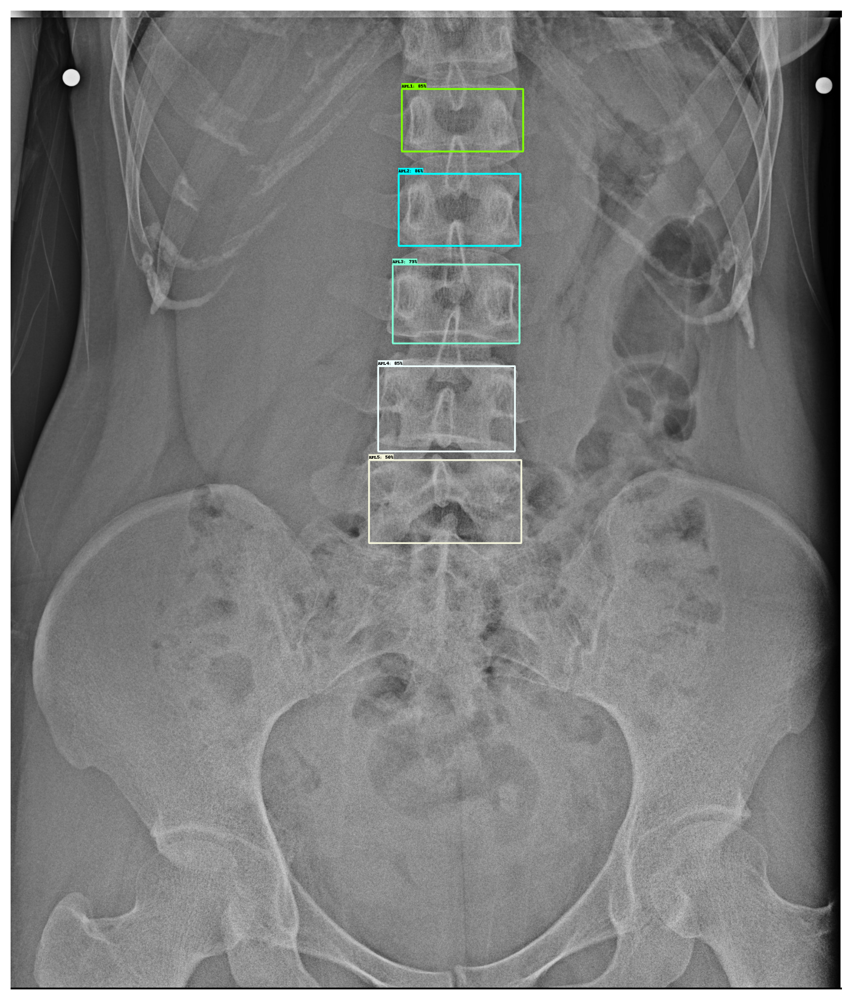

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (20,12) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF2/data/inference_graph_640/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF2/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/My Drive/0001-F-037Y0.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.4, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline

output_path = "/content/gdrive/MyDrive/My Drive/"
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.savefig(output_path)
plt.show()